In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/celeba-dataset/list_landmarks_align_celeba.csv
/kaggle/input/celeba-dataset/list_eval_partition.csv
/kaggle/input/celeba-dataset/list_attr_celeba.csv
/kaggle/input/celeba-dataset/list_bbox_celeba.csv
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/083648.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/168202.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/125778.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/059339.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/032501.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/160139.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/046754.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/178961.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/123482.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/039337.jpg
/kaggle/input/celeba-dataset/img_align_celeba/

In [2]:
import os
cwd = os.getcwd()
os.chdir(cwd)
print(os.listdir("../input"))

['celeba-dataset']


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

In [4]:
# Hyperparameters etc.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 128
IMAGE_SIZE = 64
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 10
FEATURES_DISC = 64
FEATURES_GEN = 64

In [5]:
device

device(type='cuda')

In [6]:
transforms = transforms.Compose([
    transforms.Resize([64,64]),
    transforms.ToTensor(),
    transforms.Normalize([0.5 for i in range(CHANNELS_IMG)], [0.5 for i in range(CHANNELS_IMG)])
])

In [7]:
IMAGE_PATH = '/kaggle/input/celeba-dataset/img_align_celeba'

In [8]:
dataset = datasets.ImageFolder(IMAGE_PATH, transform = transforms)

In [9]:
def split_indices(n, val_per, seed = 0):
    n_val = int(n * val_per)
    np.random.seed(seed)
    idx = np.random.permutation(n)
    return idx[n_val : ], idx[: n_val]

In [10]:
val_per = 0.5
rand_seed = 42

train_indices, val_indices = split_indices(len(dataset), val_per, rand_seed)

print(len(train_indices), len(val_indices))

101300 101299


In [11]:
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data.dataloader import DataLoader

In [12]:
# training data loader
train_sampler = SubsetRandomSampler(train_indices)
loader = DataLoader(dataset, BATCH_SIZE, sampler = train_sampler)

## Discriminator

In [13]:
class Discriminator(nn.Module):
    
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        
        self.disc = nn.Sequential(
            #size = 3*64*64
            nn.Conv2d(channels_img, features_d, kernel_size = 4, stride = 2, padding = 1), # Size : 32*32
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(features_d, features_d*2, kernel_size = 4, stride = 2, padding = 1), # size = 16*16
            nn.BatchNorm2d(features_d*2),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(features_d*2, features_d*4, kernel_size = 4, stride = 2, padding = 1), # size = 8*8
            nn.BatchNorm2d(features_d*4),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(features_d*4, features_d*8, kernel_size = 4, stride = 2, padding = 1), # size = 4*4
            nn.BatchNorm2d(features_d*8),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(features_d*8, 1, kernel_size = 4, stride = 2, padding = 0), #1*1
            nn.Sigmoid()
        )
        
        
    def forward(self, x):
        return self.disc(x)

## Generator

In [14]:
class Generator(nn.Module):
    
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim, features_g*16, kernel_size = 4, stride = 1, padding = 0), # size = 4*4
            nn.BatchNorm2d(features_g*16),
            nn.ReLU(),
            
            nn.ConvTranspose2d(features_g*16, features_g*8, kernel_size = 4, stride = 2, padding = 1), # size = 8*8
            nn.BatchNorm2d(features_g*8),
            nn.ReLU(),
            
            nn.ConvTranspose2d(features_g*8, features_g*4, kernel_size = 4, stride = 2, padding = 1), # size = 16*16
            nn.BatchNorm2d(features_g*4),
            nn.ReLU(),
            
            nn.ConvTranspose2d(features_g*4, features_g*2, kernel_size = 4, stride = 2, padding = 1), # size = 32*32
            nn.BatchNorm2d(features_g*2),
            nn.ReLU(),
            
            nn.ConvTranspose2d(features_g*2, channels_img, kernel_size = 4, stride = 2, padding = 1),
            nn.Tanh()  # [-1, 1]
        )
        
    
    def forward(self, x):
        return self.net(x)

In [15]:
def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

In [16]:
def test():
    N, in_channels, H, W = 8, 3, 64, 64
    noise_dim = 100
    x = torch.randn((N, in_channels, H, W))
    disc = Discriminator(in_channels, 8)
    assert disc(x).shape == (N, 1, 1, 1), "Discriminator test failed"
    gen = Generator(noise_dim, in_channels, 8)
    z = torch.randn((N, noise_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, H, W), "Generator test failed"
    print("Success")

In [17]:
test()

Success


In [18]:
gen = Generator(z_dim = NOISE_DIM, channels_img = CHANNELS_IMG, features_g = FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
initialize_weights(gen)
initialize_weights(disc)

In [19]:
opt_gen = optim.Adam(gen.parameters(), lr = LEARNING_RATE, betas = (0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr = LEARNING_RATE, betas = (0.5, 0.999))
criterion = nn.BCELoss()

In [20]:
def reset_grad():
    opt_disc.zero_grad()
    opt_gen.zero_grad()

## Training Discriminator

In [21]:
def train_discriminator(images):
    # create labels, for real image label is 1, for fac=ke 0
    
    real_labels = torch.ones(BATCH_SIZE, 1).to(device)
    fake_labels = torch.zeros(BATCH_SIZE, 1).to(device)
    
    # loss for real images
    
    outputs = disc(images).reshape(-1)
    d_loss_real = criterion(outputs, torch.ones_like(outputs))
    real_score = outputs
    
    z = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)
    fake_images = gen(z)
    outputs = disc(fake_images).reshape(-1)
    d_loss_fake = criterion(outputs, torch.zeros_like(outputs))
    fake_score = outputs
    
    d_loss = d_loss_real + d_loss_fake
    reset_grad()
    # Compute gradients
    
    d_loss.backward()
    #Adjust parameters using backpropagation
    
    opt_disc.step()
    
    return d_loss, real_score, fake_score

## Training Generator

In [22]:
def train_generator():
    # Generate fake images and calculate loss
    z = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)
    fake_images = gen(z)
    labels = torch.ones(BATCH_SIZE, 1).to(device)
    output = disc(fake_images).reshape(-1)
    g_loss = criterion(output, torch.ones_like(output))

    # Backprop and optimize
    reset_grad()
    g_loss.backward()
    opt_gen.step()
    return g_loss, fake_images

In [23]:
import os

sample_dir = 'samples'
if not os.path.exists(sample_dir):
    os.makedirs(sample_dir)


In [24]:
def show_img(img, label):
    print('Label: ', label)
    plt.imshow(img.permute(1,2,0), cmap = 'gray')

In [25]:
def denorm(x):
  out = (x + 1) / 2
  return out.clamp(0, 1)

## Image View

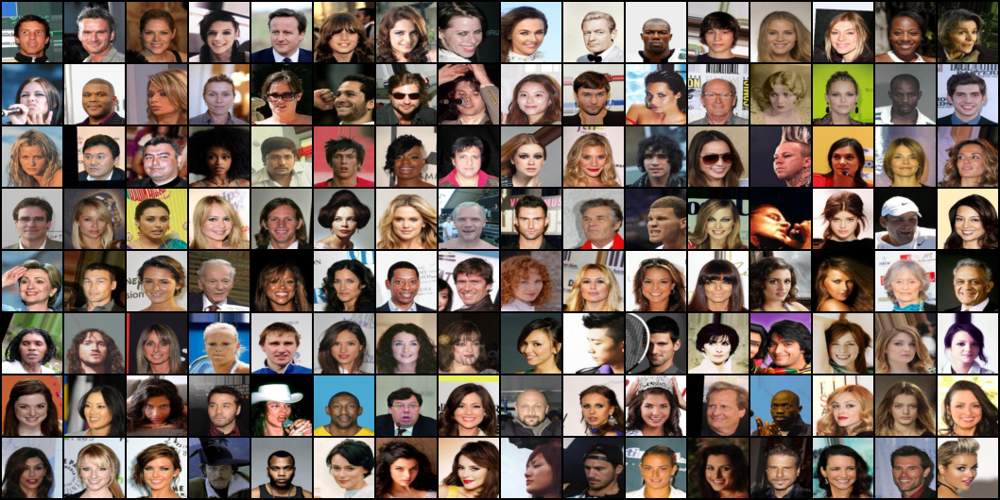

In [26]:
from IPython.display import Image
from torchvision.utils import save_image

# Save some real images
for images, _ in loader:
    images = images.reshape(images.size(0), 3, 64, 64)
    save_image(denorm(images), os.path.join(sample_dir, 'real_images.png'), nrow=16)
    break
   
Image(os.path.join(sample_dir, 'real_images.png'))

Saving fake_images-0000.png


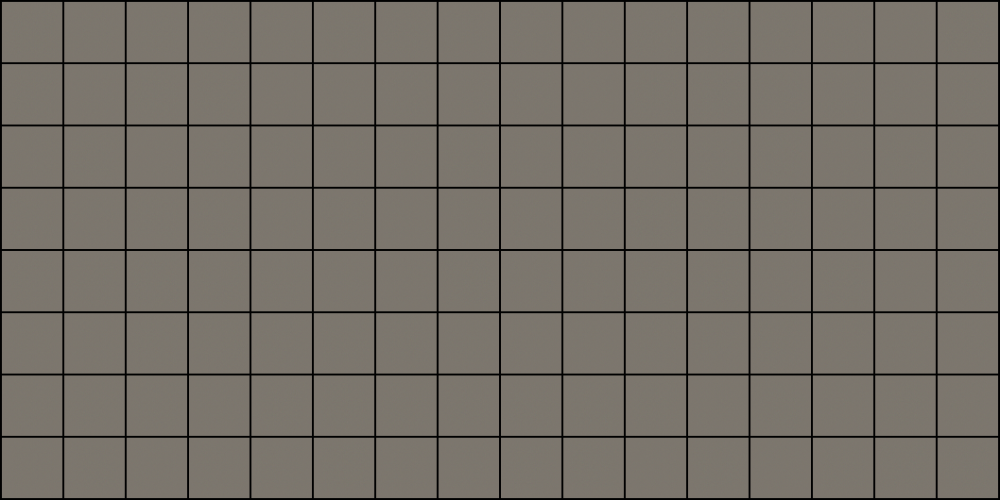

In [27]:
sample_vectors = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)

def save_fake_images(index):
    fake_images = gen(sample_vectors)
    fake_images = fake_images.reshape(fake_images.size(0), 3, 64, 64)
    fake_fname = 'fake_images-{0:0=4d}.png'.format(index)
    print('Saving', fake_fname)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=16)
    
# Before training
save_fake_images(0)
Image(os.path.join(sample_dir, 'fake_images-0000.png'))

## Training

In [28]:
%%time


total_step = len(loader)
d_losses, g_losses, real_scores, fake_scores = [], [], [], []

for epoch in range(NUM_EPOCHS):
    for i, (images, _) in enumerate(loader):
        # Load a batch & transform to vectors
        images = images.to(device)
        
        # Train the discriminator and generator
        d_loss, real_score, fake_score = train_discriminator(images)
        g_loss, fake_images = train_generator()
        
        
        # Inspect the losses
        if (i+1) % 100 == 0:
            d_losses.append(d_loss.item())
            g_losses.append(g_loss.item())
            real_scores.append(real_score.mean().item())
            fake_scores.append(fake_score.mean().item())
            print('Epoch [{}/{}], Step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}' 
                  .format(epoch, NUM_EPOCHS, i+1, total_step, d_loss.item(), g_loss.item(), 
                          real_score.mean().item(), fake_score.mean().item()))
        
       
        
    # Sample and save images
    save_fake_images(epoch+1)

Epoch [0/10], Step [100/792], d_loss: 0.0493, g_loss: 3.9782, D(x): 0.98, D(G(z)): 0.03
Epoch [0/10], Step [200/792], d_loss: 0.8617, g_loss: 1.9473, D(x): 0.63, D(G(z)): 0.30
Epoch [0/10], Step [300/792], d_loss: 1.3751, g_loss: 0.9573, D(x): 0.45, D(G(z)): 0.40
Epoch [0/10], Step [400/792], d_loss: 1.4606, g_loss: 1.9462, D(x): 0.70, D(G(z)): 0.64
Epoch [0/10], Step [500/792], d_loss: 1.2518, g_loss: 1.5631, D(x): 0.56, D(G(z)): 0.46
Epoch [0/10], Step [600/792], d_loss: 1.0837, g_loss: 1.4693, D(x): 0.54, D(G(z)): 0.34
Epoch [0/10], Step [700/792], d_loss: 1.3792, g_loss: 1.3184, D(x): 0.47, D(G(z)): 0.43
Saving fake_images-0001.png
Epoch [1/10], Step [100/792], d_loss: 1.1453, g_loss: 1.6434, D(x): 0.55, D(G(z)): 0.39
Epoch [1/10], Step [200/792], d_loss: 1.1095, g_loss: 2.1278, D(x): 0.70, D(G(z)): 0.50
Epoch [1/10], Step [300/792], d_loss: 1.0307, g_loss: 1.8967, D(x): 0.70, D(G(z)): 0.47
Epoch [1/10], Step [400/792], d_loss: 1.1159, g_loss: 1.0543, D(x): 0.46, D(G(z)): 0.24
Epoc

In [29]:
# Save the model checkpoints 
torch.save(gen.state_dict(), 'G.ckpt')
torch.save(disc.state_dict(), 'D.ckpt')

In [30]:
import cv2
import os
from IPython.display import FileLink

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'fake_images' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (650,650))
[out.write(cv2.imread(fname)) for fname in files]
out.release()
FileLink('gans_training.avi')

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'avi / AVI (Audio Video Interleaved)'
OpenCV: FFMPEG: fallback to use tag 0x34504d46/'FMP4'


/kaggle/working/gans_training.avi

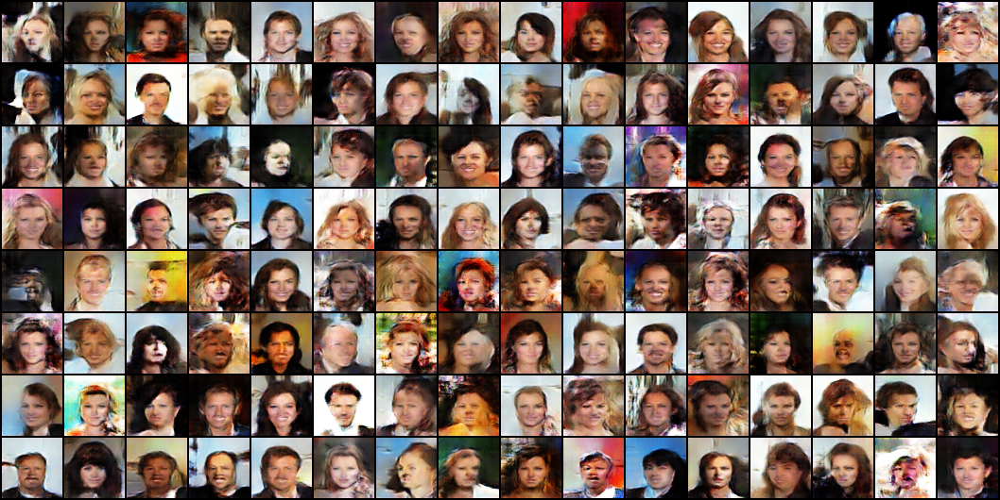

In [31]:
Image('./samples/fake_images-0005.png')